In [1]:
Pkg.add("StatsBase")
Pkg.add("Gadfly")
Pkg.add("HypothesisTests")

INFO: Nothing to be done
INFO: METADATA is out-of-date — you may not have the latest version of StatsBase
INFO: Use `Pkg.update()` to get the latest versions of your packages
INFO: Nothing to be done
INFO: METADATA is out-of-date — you may not have the latest version of Gadfly
INFO: Use `Pkg.update()` to get the latest versions of your packages
INFO: Nothing to be done
INFO: METADATA is out-of-date — you may not have the latest version of HypothesisTests
INFO: Use `Pkg.update()` to get the latest versions of your packages


In [2]:
Pkg.update() # normally this won't be that  long of an output...

INFO: Updating METADATA...
INFO: Updating cache of Libz...
INFO: Updating cache of Measures...
INFO: Updating cache of Blosc...
INFO: Updating cache of AutoHashEquals...
INFO: Updating cache of Grid...
INFO: Updating cache of HypothesisTests...
INFO: Updating cache of MultivariateStats...
INFO: Updating cache of GR...
INFO: Updating cache of HDF5...
INFO: Updating cache of DataStructures...
INFO: Updating cache of PositiveFactorizations...
INFO: Updating GeneratedTypes...
INFO: Updating GeneratedTables...
INFO: Updating TSne...
INFO: Updating GraphPlot...
INFO: Updating ComputeFramework...
INFO: Updating ELM...
INFO: Updating PlotlyJS...
INFO: Updating ROC...
INFO: Computing changes...
INFO: Cloning cache of Combinatorics from git://github.com/JuliaLang/Combinatorics.jl.git
INFO: Upgrading AutoHashEquals: v0.0.9 => v0.0.10
INFO: Upgrading Blosc: v0.1.5 => v0.1.6
INFO: Installing Combinatorics v0.2.1
INFO: Upgrading DataStructures: v0.4.4 => v0.4.5
INFO: Upgrading GR: v0.13.0 => v0.14.0

In [3]:
using StatsBase
using Gadfly
using HypothesisTests
using DataFrames
# this output isn't normally that long, unless you update many packages...

INFO: Recompiling stale cache file C:\Users\Zacharias\.julia\lib\v0.4\Rmath.ji for module Rmath.
INFO: Recompiling stale cache file C:\Users\Zacharias\.julia\lib\v0.4\StatsFuns.ji for module StatsFuns.
INFO: Recompiling stale cache file C:\Users\Zacharias\.julia\lib\v0.4\StatsBase.ji for module StatsBase.
INFO: Recompiling stale cache file C:\Users\Zacharias\.julia\lib\v0.4\FixedSizeArrays.ji for module FixedSizeArrays.
INFO: Recompiling stale cache file C:\Users\Zacharias\.julia\lib\v0.4\Gadfly.ji for module Gadfly.
INFO: Recompiling stale cache file C:\Users\Zacharias\.julia\lib\v0.4\Codecs.ji for module Codecs.
INFO: Recompiling stale cache file C:\Users\Zacharias\.julia\lib\v0.4\Colors.ji for module Colors.
INFO: Recompiling stale cache file C:\Users\Zacharias\.julia\lib\v0.4\FixedPointNumbers.ji for module FixedPointNumbers.
INFO: Recompiling stale cache file C:\Users\Zacharias\.julia\lib\v0.4\ColorTypes.ji for module ColorTypes.
INFO: Recompiling stale cache file C:\Users\Zachari

In [4]:
X = readcsv("d:/data/Magic/magic04.csv")

N, n = size(X)
I = Array(Float64, N, n-1)
O = X[:, end]

for i = 1:N
    for j = 1:(n-1)
        I[i,j] = Float64(X[i,j])
    end
end

(AbstractArray{T<:Any, 1}, Integer) in module Base at combinatorics.jl:70 overwritten in module Combinatorics at C:\Users\Zacharias\.julia\v0.4\Combinatorics\src\permutations.jl:136.


In [5]:
for i = 1:size(I,2)
    describe(I[:,i])
end

Summary Stats:
Mean:         53.250154
Minimum:      4.283500
1st Quartile: 24.336000
Median:       37.147700
3rd Quartile: 70.122175
Maximum:      334.177000
Summary Stats:
Mean:         22.180966
Minimum:      0.000000
1st Quartile: 11.863800
Median:       17.139900
3rd Quartile: 24.739475
Maximum:      256.382000
Summary Stats:
Mean:         2.825017
Minimum:      1.941300
1st Quartile: 2.477100
Median:       2.739600
3rd Quartile: 3.101600
Maximum:      5.323300
Summary Stats:
Mean:         0.380327
Minimum:      0.013100
1st Quartile: 0.235800
Median:       0.354150
3rd Quartile: 0.503700
Maximum:      0.893000
Summary Stats:
Mean:         0.214657
Minimum:      0.000300
1st Quartile: 0.128475
Median:       0.196500
3rd Quartile: 0.285225
Maximum:      0.675200
Summary Stats:
Mean:         -4.331745
Minimum:      -457.916100
1st Quartile: -20.586550
Median:       4.013050
3rd Quartile: 24.063700
Maximum:      575.240700
Summary Stats:
Mean:         10.545545
Minimum:      -331.780

In [6]:
println(cor(I))
C = cor(I)

[1.0 0.7705120396837163 0.7024537576802133 -0.6309990789441375 -0.5981451310343227 -0.36855648667770635 -0.11974712839849595 0.01338923172079756 -0.0087774911156159 0.41846607102909467
 0.7705120396837163 1.0 0.7175168553176453 -0.609778668208619 -0.5811407280368859 -0.26696091653407905 -0.17623422360754684 0.03974360775459574 0.06606137710396846 0.336816114684482
 0.7024537576802133 0.7175168553176453 1.0 -0.8508497973208036 -0.8088350117321308 -0.1598629542638069 0.0951571942273846 0.015454743012780341 -0.1866751639128357 0.43704075700982425
 -0.6309990789441375 -0.609778668208619 -0.8508497973208036 1.0 0.9764118508094742 0.11227222630884257 -0.12189933746198132 -0.01129406851977836 0.23527190115014923 -0.3283323019279127
 -0.5981451310343227 -0.5811407280368859 -0.8088350117321308 0.9764118508094742 1.0 0.10015922010503556 -0.1187689087567677 -0.010965602436160026 0.22979853544818013 -0.30462467820322325
 -0.36855648667770635 -0.26696091653407905 -0.1598629542638069 0.1122722263088

10x10 Array{Float64,2}:
  1.0          0.770512    0.702454   -0.630999   …  -0.00877749   0.418466 
  0.770512     1.0         0.717517   -0.609779       0.0660614    0.336816 
  0.702454     0.717517    1.0        -0.85085       -0.186675     0.437041 
 -0.630999    -0.609779   -0.85085     1.0            0.235272    -0.328332 
 -0.598145    -0.581141   -0.808835    0.976412       0.229799    -0.304625 
 -0.368556    -0.266961   -0.159863    0.112272   …  -0.0556886   -0.20673  
 -0.119747    -0.176234    0.0951572  -0.121899      -0.186275     0.0370252
  0.0133892    0.0397436   0.0154547  -0.0112941      0.00465913   0.0114266
 -0.00877749   0.0660614  -0.186675    0.235272       1.0         -0.220556 
  0.418466     0.336816    0.437041   -0.328332      -0.220556     1.0      

In [7]:
varnames = ["fLength", "fWidth", "fSize", "fConc", "fConc1", "fAsym", "fM3Long", "fM3Trans", "fAlpha", "fDist", "class"]
new_names = [symbol(varnames[i]) for i = 1:length(varnames)]
df = readtable("magic04.csv", header = false)
old_names = names(df)

for i = 1:length(old_names)
    rename!(df, old_names[i], new_names[i])
end

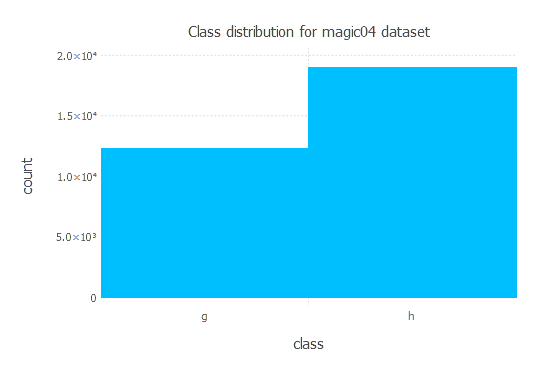

In [10]:
plot(df, x = "class", Geom.bar, Guide.ylabel("count"), Guide.title("Class distribution for magic04 dataset"))

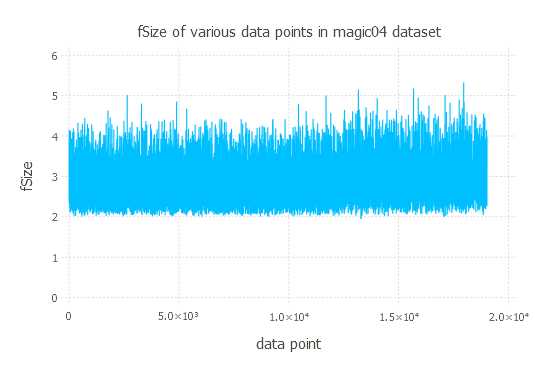

In [11]:
plot(df, y = "fSize", Geom.line, Guide.xlabel("data point"), Guide.ylabel("fSize"), Guide.title("fSize of various data points in magic04 dataset"))

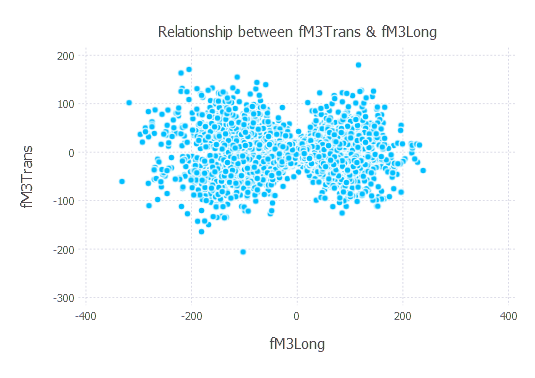

In [9]:
plot(x = df[:fM3Long], y = df[:fM3Trans], Geom.point, Guide.xlabel("fM3Long"), Guide.ylabel("fM3Trans"), Guide.title("Relationship between fM3Trans & fM3Long"))

In [ ]:
Pkg.clone("git://github.com/lejon/TSne.jl.git")

In [25]:
using TSne

INFO: Recompiling stale cache file C:\Users\Zacharias\.julia\lib\v0.4\ProgressMeter.ji for module ProgressMeter.


In [30]:
import StatsBase.sample

In [31]:
include("normalize.jl")
include("sample.jl")

sample (generic function with 11 methods)

Computing point perplexities100%|███████████████████████| Time: 0:00:02
Computing t-SNE100%|████████████████████████████████████| Time: 0:01:04


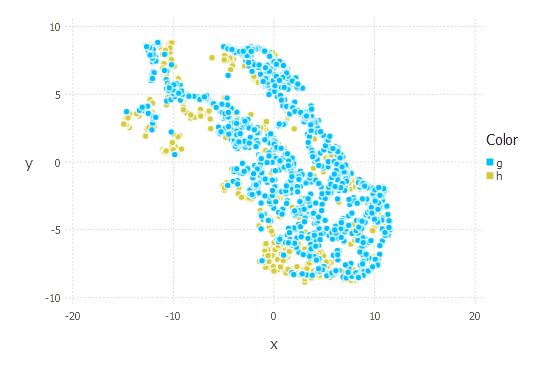

In [32]:
I = normalize(I, "stat")
X, Z = sample(I, O, 2000)
Y = tsne(X, 2) # this may take a minute or so...
P = plot(x = Y[:,1], y = Y[:,2], color = Z)

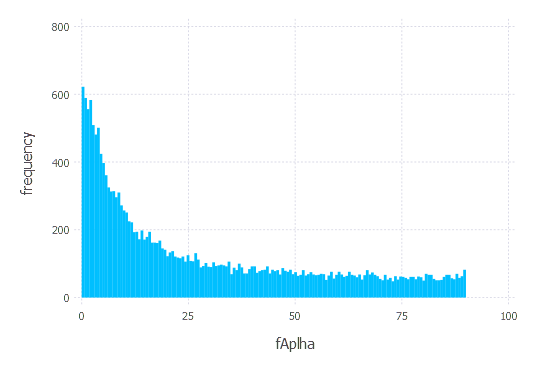

In [34]:
p = plot(x = df[:fAlpha], Geom.histogram, Guide.xlabel("fAplha"), Guide.ylabel("frequency"))

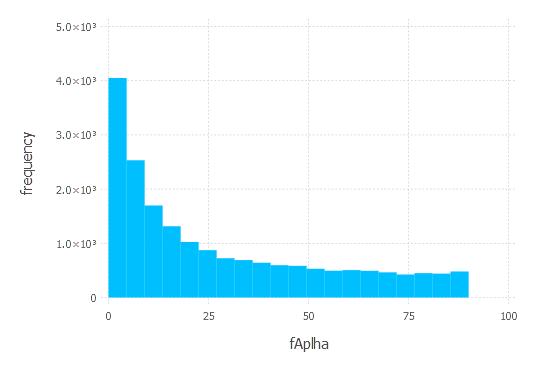

In [35]:
p = plot(x = df[:fAlpha], Geom.histogram(bincount = 20), Guide.xlabel("fAplha"), Guide.ylabel("frequency"))

In [36]:
ind1 = findin(df[:class], ["g"])
ind2 = findin(df[:class], ["h"])
x_g = df[:fDist][ind1]
x_h = df[:fDist][ind2]
v_g = var(x_g)
v_h = var(x_h)
pvalue(UnequalVarianceTTest(x_g, x_h))

7.830555575327981e-18

In [37]:
X = df[:fLength]
m = mean(X)
s = std(X)
all = 1:19020
high = all[X .>= m + s]
medium = all[(X .> m - s)&(X .< m + s)]
low = all[X .<= m - s]
g = findin(df[:class], ["g"])
h = findin(df[:class], ["h"])
C = Array(Int64, 2, 3)
C[1,1] = length(intersect(low, g))
C[1,2] = length(intersect(medium, g))
C[1,3] = length(intersect(high, g))
C[2,1] = length(intersect(low, h))
C[2,2] = length(intersect(medium, h))
C[2,3] = length(intersect(high, h))
ChisqTest(C)

Pearson's Chi-square Test
-------------------------
Population details:
    parameter of interest:   Multinomial Probabilities
    value under h_0:         [0.0011590212748548486,0.0006285707335573489,0.5633184284404816,0.305503863883388,0.08389268698287596,0.04549742868484223]
    point estimate:          [0.0,0.0017875920084121978,0.6176130389064143,0.2512092534174553,0.030757097791798107,0.09863301787592009]
    95% confidence interval: [(0.0,0.029442691903256667),(0.0,0.031230283911668866),(0.5880651945320715,0.6470557308096709),(0.22166140904311252,0.280651945320712),(0.0012092534174553103,0.060199789695054774),(0.0690851735015773,0.12807570977917673)]

Test summary:
    outcome with 95% confidence: reject h_0
    two-sided p-value:           0.0 (extremely significant)

Details:
    Sample size:        19020
    statistic:          2166.176574737312
    degrees of freedom: 2
    residuals:          [-4.695166093732918,6.375578333321472,9.976656015086633,-13.547327327501765,-25.30

In [38]:
df = readtable("d:/data/OnlineNewsPopularity/OnlineNewsPopularity.csv", header = true)
Z = names(df)[2:end]

60-element Array{Symbol,1}:
 :timedelta                   
 :n_tokens_title              
 :n_tokens_content            
 :n_unique_tokens             
 :n_non_stop_words            
 :n_non_stop_unique_tokens    
 :num_hrefs                   
 :num_self_hrefs              
 :num_imgs                    
 :num_videos                  
 :average_token_length        
 :num_keywords                
 :data_channel_is_lifestyle   
 ⋮                            
 :rate_negative_words         
 :avg_positive_polarity       
 :min_positive_polarity       
 :max_positive_polarity       
 :avg_negative_polarity       
 :min_negative_polarity       
 :max_negative_polarity       
 :title_subjectivity          
 :title_sentiment_polarity    
 :abs_title_subjectivity      
 :abs_title_sentiment_polarity
 :shares                      

In [39]:
for z in Z
    X = convert(Array, df[symbol(z)]);
    println(z, "\t", summarystats(X))
end

timedelta	Summary Stats:
Mean:         354.530471
Minimum:      8.000000
1st Quartile: 164.000000
Median:       339.000000
3rd Quartile: 542.000000
Maximum:      731.000000

n_tokens_title	Summary Stats:
Mean:         10.398749
Minimum:      2.000000
1st Quartile: 9.000000
Median:       10.000000
3rd Quartile: 12.000000
Maximum:      23.000000

n_tokens_content	Summary Stats:
Mean:         546.514731
Minimum:      0.000000
1st Quartile: 246.000000
Median:       409.000000
3rd Quartile: 716.000000
Maximum:      8474.000000

n_unique_tokens	Summary Stats:
Mean:         0.548216
Minimum:      0.000000
1st Quartile: 0.470870
Median:       0.539226
3rd Quartile: 0.608696
Maximum:      701.000000

n_non_stop_words	Summary Stats:
Mean:         0.996469
Minimum:      0.000000
1st Quartile: 1.000000
Median:       1.000000
3rd Quartile: 1.000000
Maximum:      1042.000000

n_non_stop_unique_tokens	Summary Stats:
Mean:         0.689175
Minimum:      0.000000
1st Quartile: 0.625739
Median:       0.

In [40]:
for z in Z
    X = df[symbol(z)]
    Y = (X - mean(X)) / std(X)
    df[symbol(z)] = Y
end

In [44]:
C = Array(Any, 59, 2)

for i = 1:59
    X = df[symbol(Z[i])]
    C[i,1] = Z[i]
    C[i,2] = cor(X, df[:shares])
end

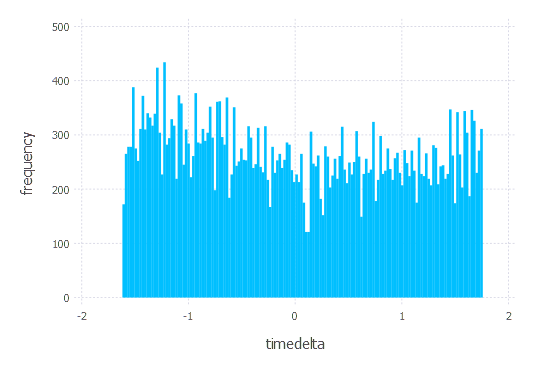

In [48]:
i = 1
plot(x = df[symbol(Z[i])], Geom.histogram, 	Guide.xlabel(string(Z[i])), Guide.ylabel("frequency"))

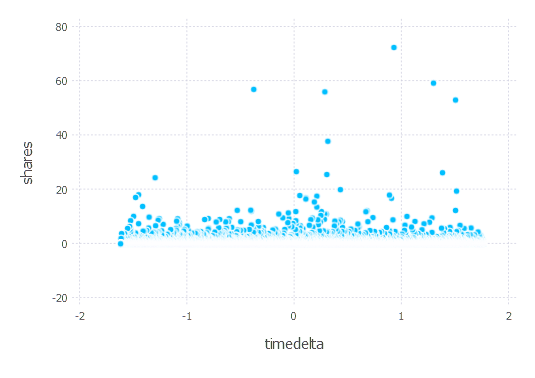

In [47]:
plot(x = df[symbol(Z[i])], y = df[:shares], Geom.point, Guide.xlabel(string(Z[i])), Guide.ylabel("shares"))

In [51]:
a = 0.01 
N = length(Y)
mY = mean(Y)
ind1 = (1:N)[Y .>= mY]
ind2 = (1:N)[Y .< mY]
A = Array(Any, 59, 4)

for i = 1:59
    X = convert(Array, df[symbol(Z[i])])
    X_high = X[ind1]
    X_low = X[ind2]
    var_high = var(X_high)
    var_low = var(X_low)
    if abs(2(var_high - var_low) / (var_high + var_low)) <= 0.1
        p = pvalue(EqualVarianceTTest(X_high,X_low))
    else
        p = pvalue(UnequalVarianceTTest(X_high,X_low))
    end
    A[i,:] = [i, Z[i], p, p < a]
    if p < a
        println(i, "\t", Z[i]) 
    end
end

1	timedelta
2	n_tokens_title
7	num_hrefs
9	num_imgs
10	num_videos
11	average_token_length
12	num_keywords
13	data_channel_is_lifestyle
14	data_channel_is_entertainment
15	data_channel_is_bus
16	data_channel_is_socmed
17	data_channel_is_tech
18	data_channel_is_world
20	kw_max_min
21	kw_avg_min
22	kw_min_max
24	kw_avg_max
25	kw_min_avg
26	kw_max_avg
27	kw_avg_avg
28	self_reference_min_shares
29	self_reference_max_shares
30	self_reference_avg_sharess
32	weekday_is_tuesday
33	weekday_is_wednesday
34	weekday_is_thursday
36	weekday_is_saturday
37	weekday_is_sunday
38	is_weekend
40	LDA_01
41	LDA_02
42	LDA_03
44	global_subjectivity
45	global_sentiment_polarity
46	global_rate_positive_words
49	rate_negative_words
50	avg_positive_polarity
52	max_positive_polarity
53	avg_negative_polarity
54	min_negative_polarity
55	max_negative_polarity
56	title_subjectivity
57	title_sentiment_polarity
59	abs_title_sentiment_polarity


Computing point perplexities100%|███████████████████████| Time: 0:00:02
Computing t-SNE100%|████████████████████████████████████| Time: 0:01:06


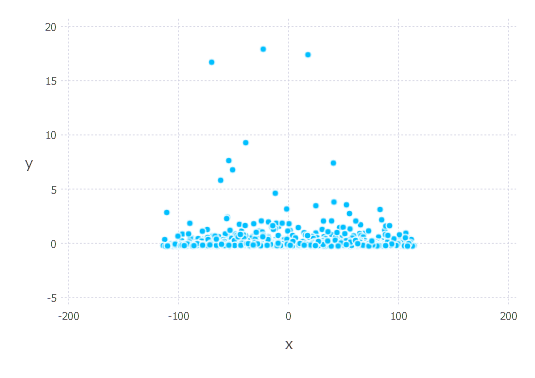

In [67]:
include("normalize.jl")
X = Array(df)
Y = map(Float64, X[:,end])
X = map(Float64, X[:,2:(end-1)])
X = normalize(X, "stat")
Y = normalize(Y, "stat")
ind = randperm(N)[1:2000]
X = X[ind,:]
Y = Y[ind]
X1 = tsne(X, 1) # this may take a minute or so...
plot(x = X1, y = Y, Geom.point)